In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image_dataset_from_directory
from keras.applications import ResNet50
from keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from keras.applications.resnet50 import preprocess_input
from sklearn.metrics import accuracy_score
from PIL import Image
import cv2
import tensorflow as tf
import random

In [14]:
img_directory = "Part4-data/"

train_ds = image_dataset_from_directory(
    img_directory,
    validation_split=0.2,
    batch_size=1,
    seed=0,
    subset = 'training',
    label_mode = 'categorical',
    image_size=(224, 224),
    shuffle=True
)

test_ds = image_dataset_from_directory(
    img_directory,
    validation_split=0.2,
    batch_size=1,
    seed=0,
    subset = 'validation',
    label_mode = 'categorical',
    image_size=(224, 224),
    shuffle=True
)

Found 266 files belonging to 2 classes.
Using 213 files for training.
Found 266 files belonging to 2 classes.
Using 53 files for validation.


In [15]:
train_ds.class_names

['Classical style comic strip', 'Manga style comic strip']

In [16]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

vgg16_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in vgg16_model.layers:
    layer.trainable = False

cnn = models.Sequential([
    vgg16_model,
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(2, activation='softmax')
])

# Compile the model
cnn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history=cnn.fit(train_ds, validation_data=test_ds, epochs=5)


Epoch 1/5
213/213 [==============================] - 47s 215ms/step - loss: 10.4927 - accuracy: 0.7559 - val_loss: 11.6345 - val_accuracy: 0.6604
Epoch 2/5
213/213 [==============================] - 45s 212ms/step - loss: 2.8398 - accuracy: 0.9249 - val_loss: 1.8646 - val_accuracy: 0.9057
Epoch 3/5
213/213 [==============================] - 48s 226ms/step - loss: 1.0826 - accuracy: 0.9765 - val_loss: 1.8871 - val_accuracy: 0.9057
Epoch 4/5
213/213 [==============================] - 45s 213ms/step - loss: 0.8217 - accuracy: 0.9765 - val_loss: 6.3423 - val_accuracy: 0.7925
Epoch 5/5
213/213 [==============================] - 45s 212ms/step - loss: 0.5377 - accuracy: 0.9812 - val_loss: 2.9080 - val_accuracy: 0.9245


In [17]:
pred=[np.argmax(i) for i in cnn.predict(test_ds)]
y_pred=[train_ds.class_names[i] for i in pred]

53/53 [==============================] - 7s 126ms/step


In [18]:
class_labels = train_ds.class_names


1/1 [==============================] - 0s 181ms/step


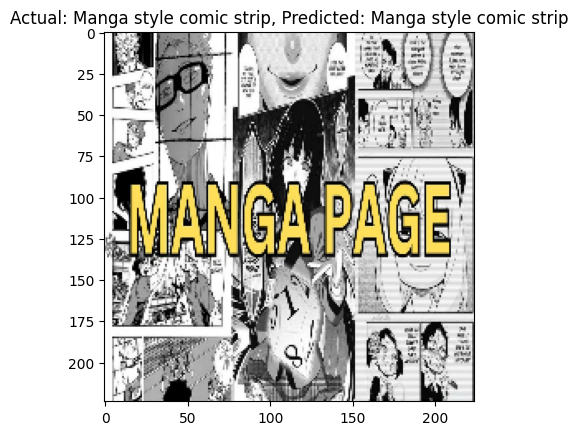

1/1 [==============================] - 0s 161ms/step


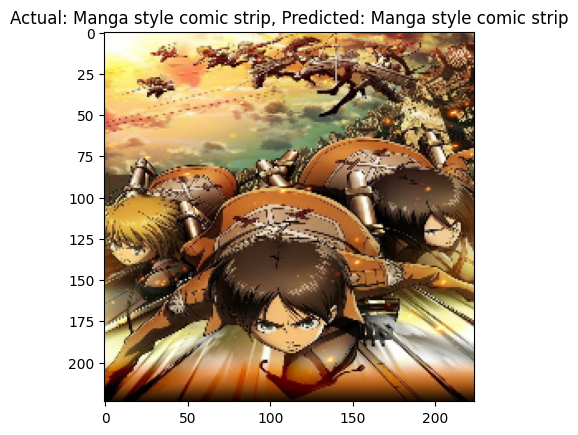

1/1 [==============================] - 0s 149ms/step


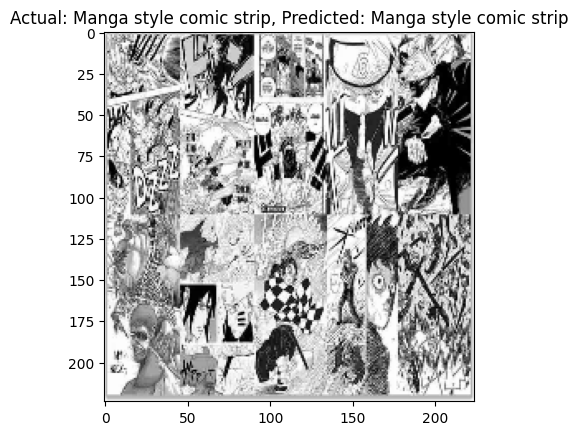

1/1 [==============================] - 0s 160ms/step


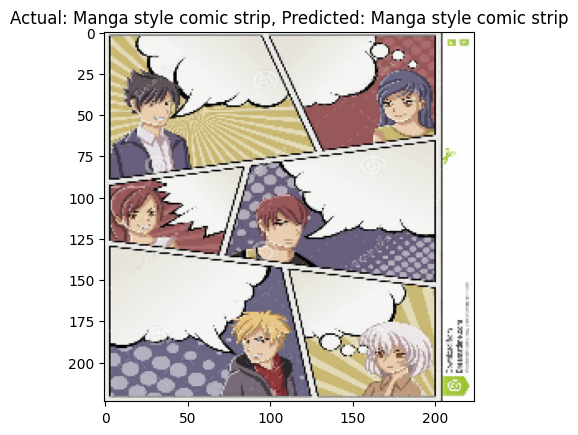

1/1 [==============================] - 0s 143ms/step


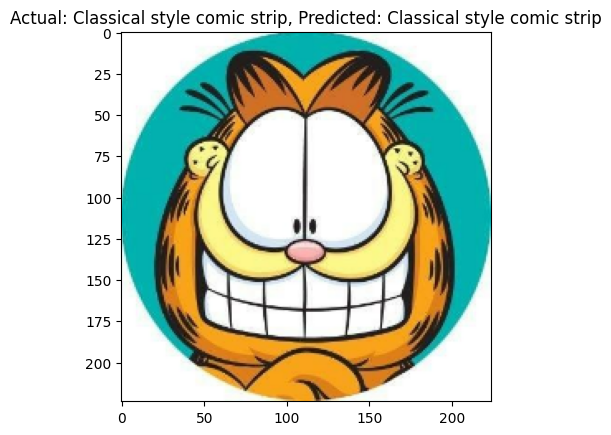

1/1 [==============================] - 0s 150ms/step


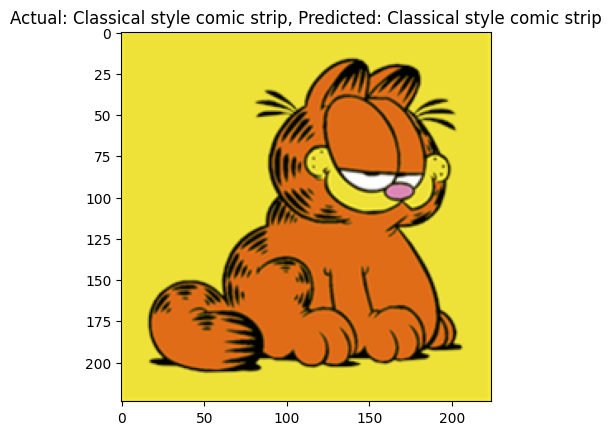

1/1 [==============================] - 0s 182ms/step


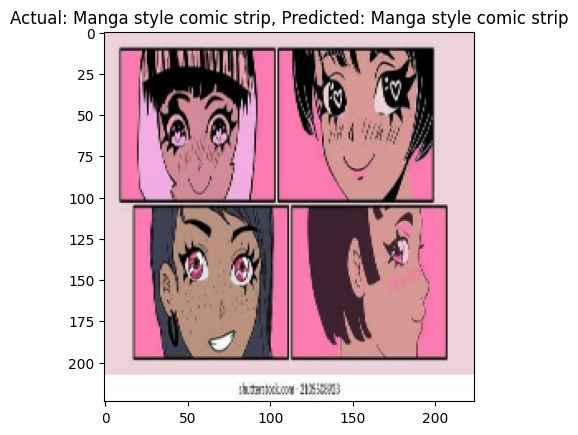

1/1 [==============================] - 0s 159ms/step


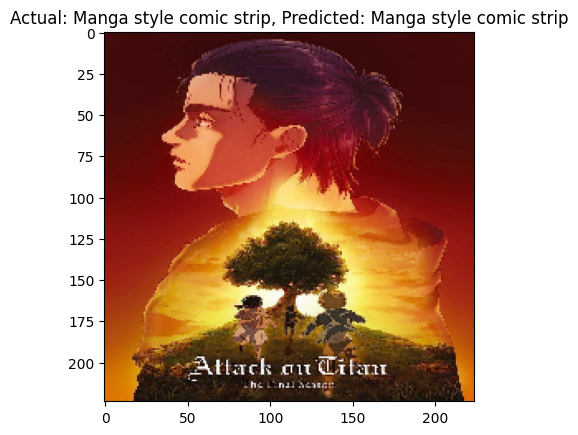

1/1 [==============================] - 0s 184ms/step


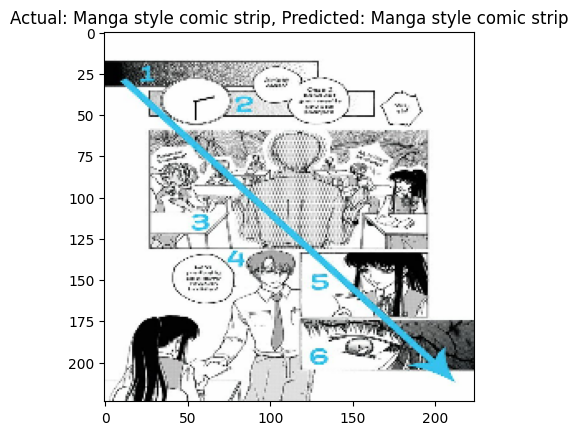

1/1 [==============================] - 0s 161ms/step


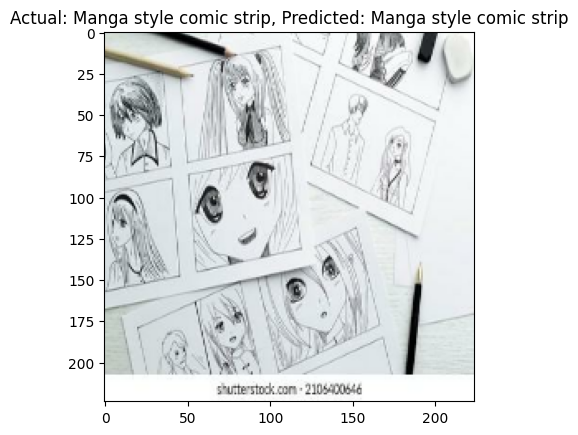

1/1 [==============================] - 0s 184ms/step


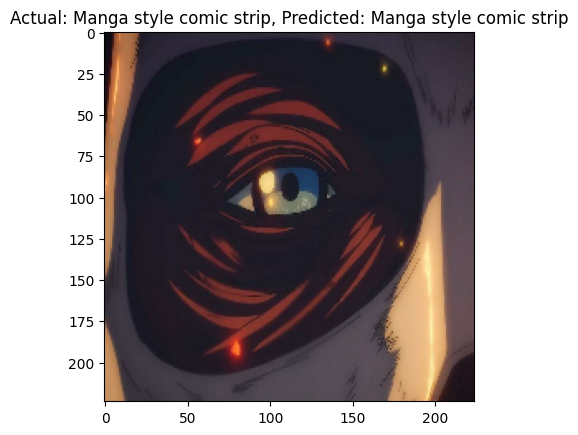

1/1 [==============================] - 0s 169ms/step


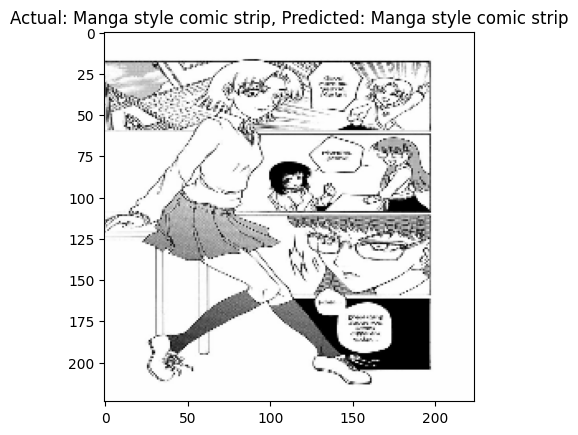

1/1 [==============================] - 0s 148ms/step


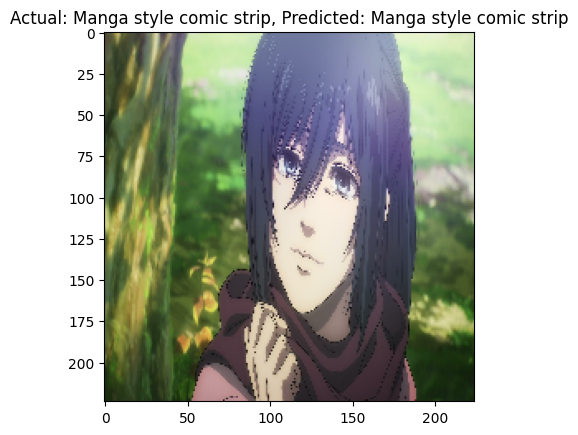

1/1 [==============================] - 0s 172ms/step


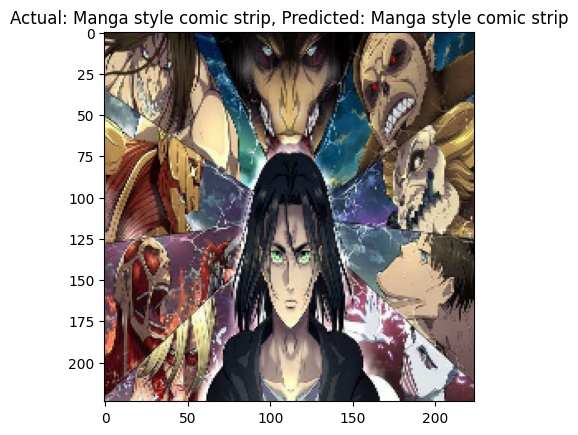

1/1 [==============================] - 0s 177ms/step


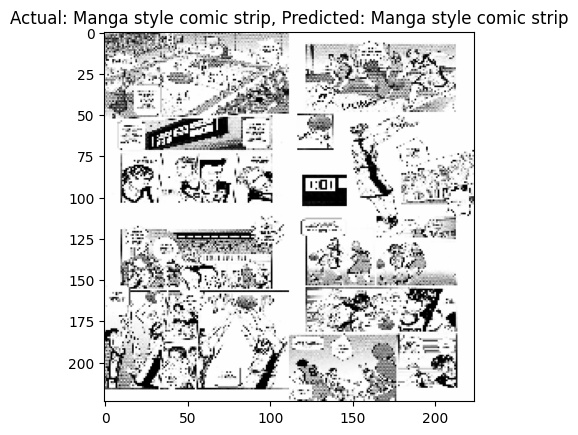

1/1 [==============================] - 0s 197ms/step


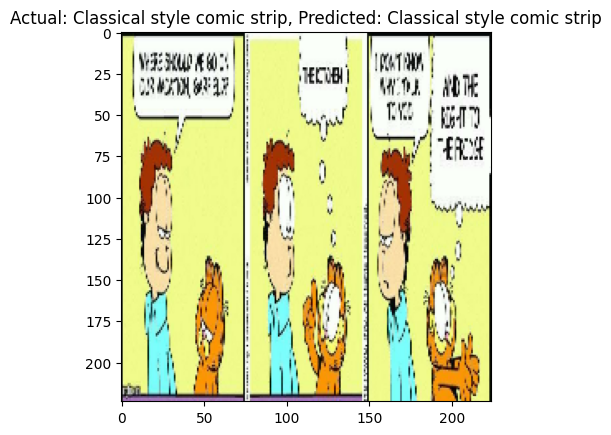

1/1 [==============================] - 0s 167ms/step


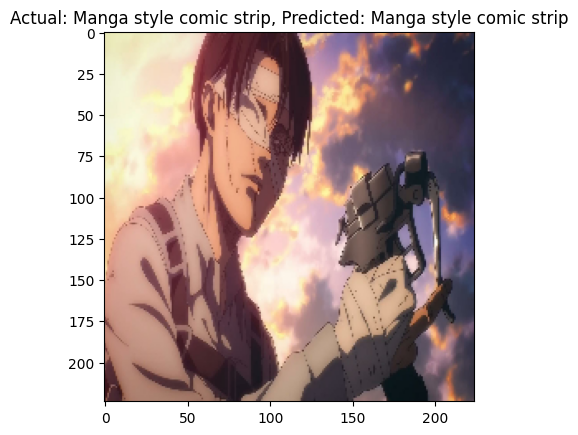

1/1 [==============================] - 0s 163ms/step


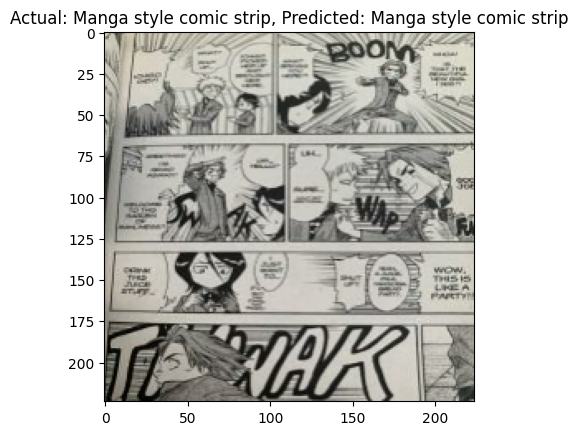

1/1 [==============================] - 0s 209ms/step


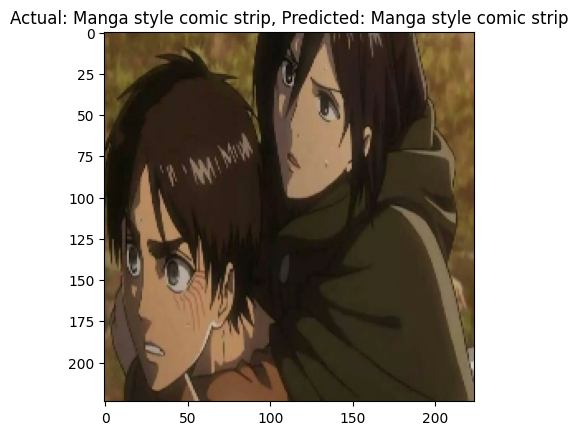

1/1 [==============================] - 0s 145ms/step


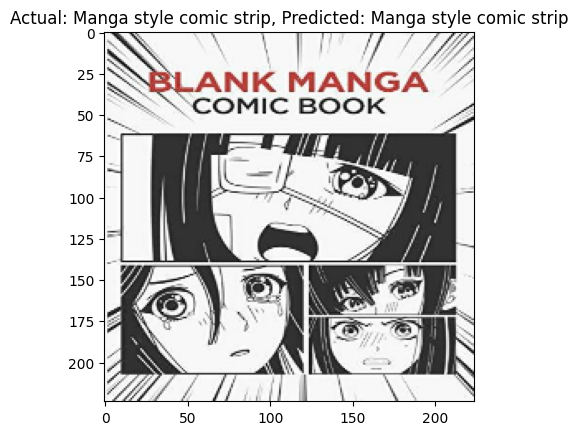

1/1 [==============================] - 0s 175ms/step


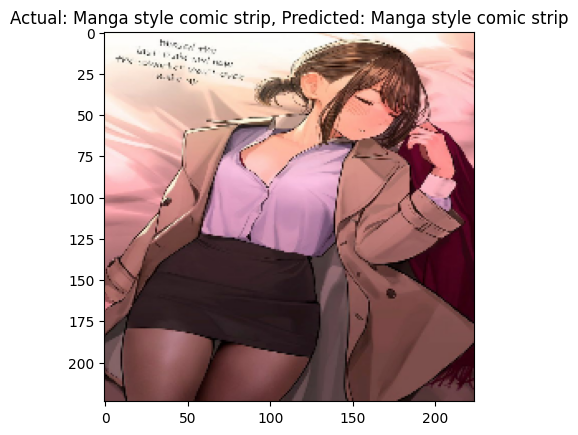

1/1 [==============================] - 0s 188ms/step


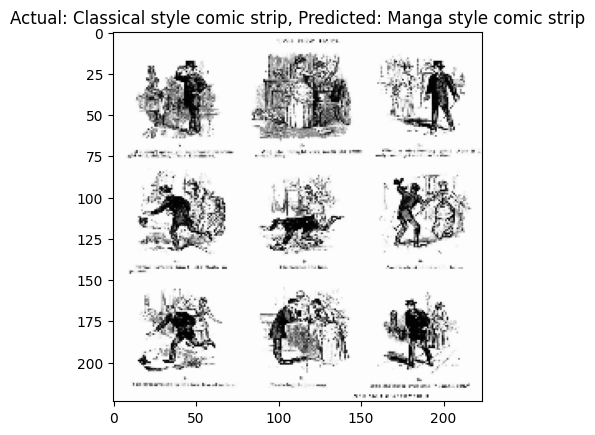

1/1 [==============================] - 0s 158ms/step


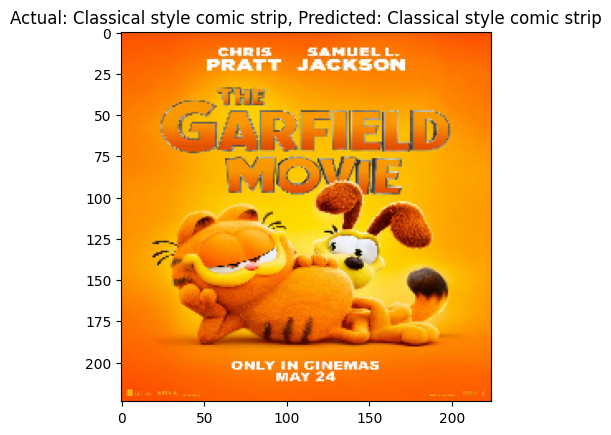

1/1 [==============================] - 0s 198ms/step


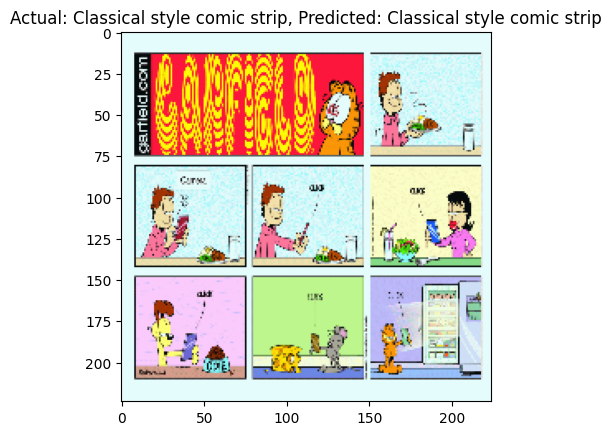

1/1 [==============================] - 0s 175ms/step


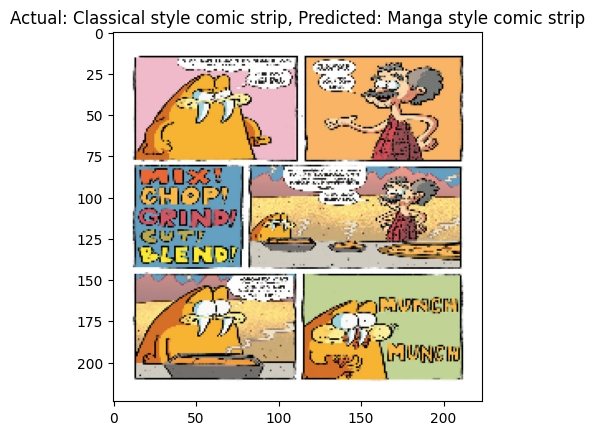

1/1 [==============================] - 0s 157ms/step


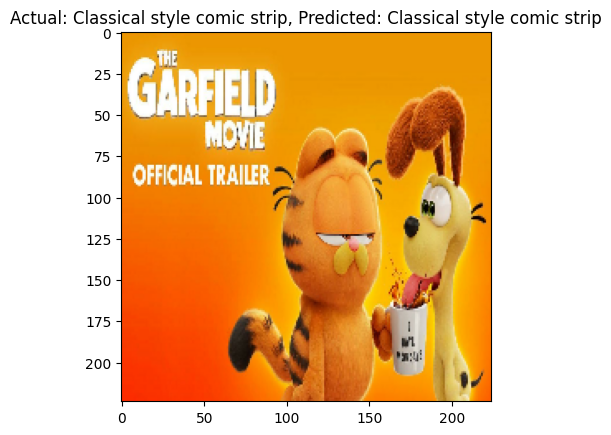

1/1 [==============================] - 0s 182ms/step


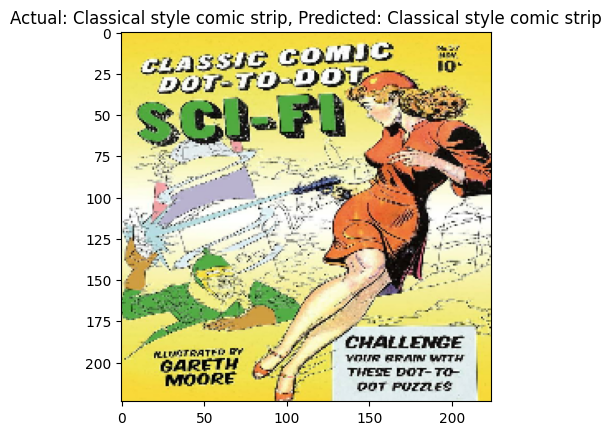

1/1 [==============================] - 0s 165ms/step


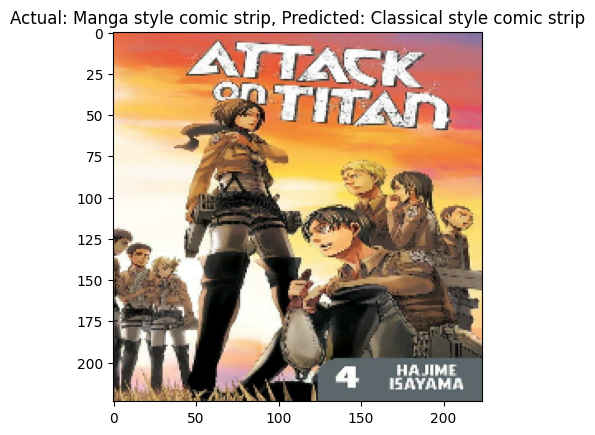

1/1 [==============================] - 0s 182ms/step


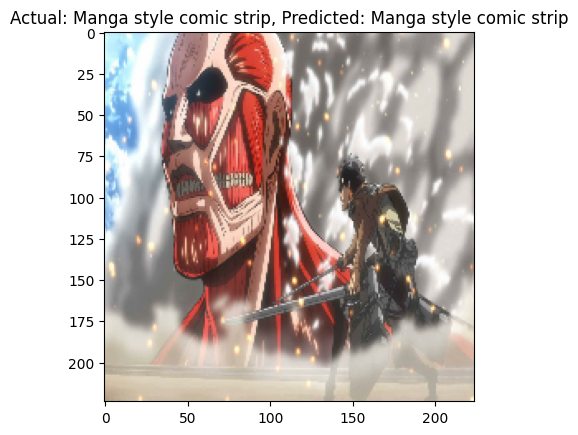

1/1 [==============================] - 0s 179ms/step


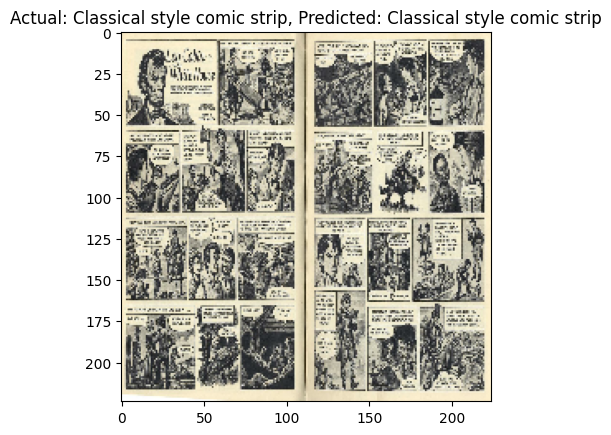

1/1 [==============================] - 0s 179ms/step


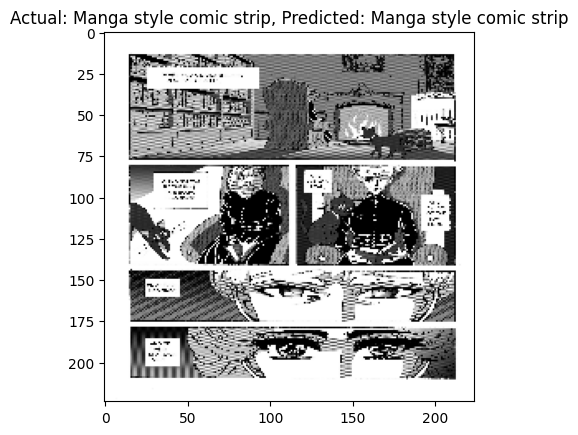

1/1 [==============================] - 0s 184ms/step


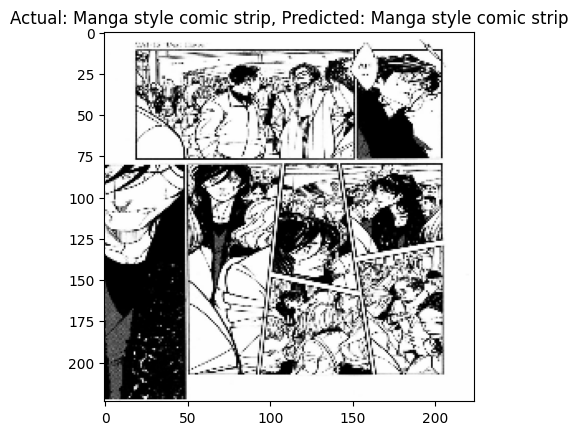

1/1 [==============================] - 0s 182ms/step


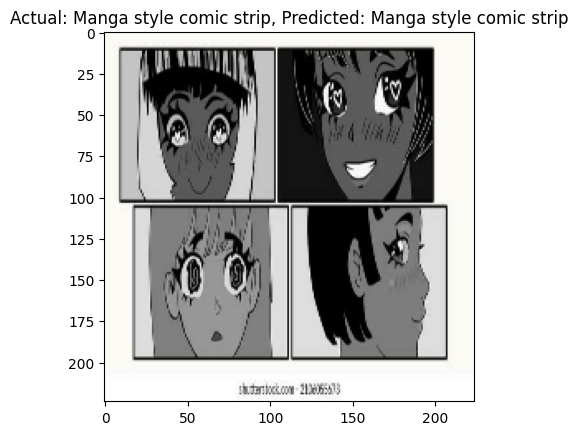

1/1 [==============================] - 0s 183ms/step


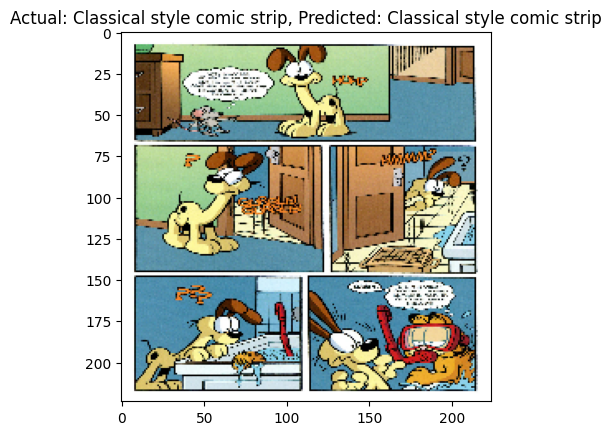

1/1 [==============================] - 0s 181ms/step


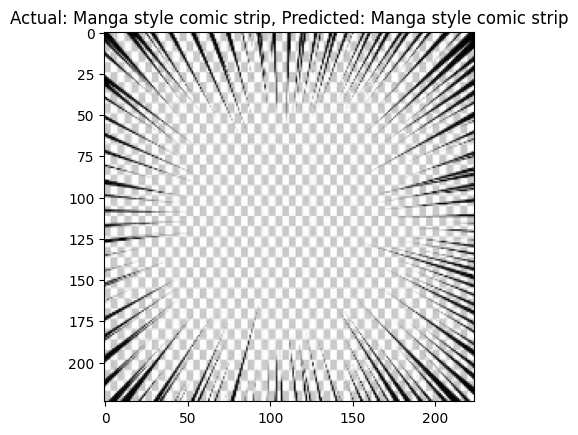

1/1 [==============================] - 0s 186ms/step


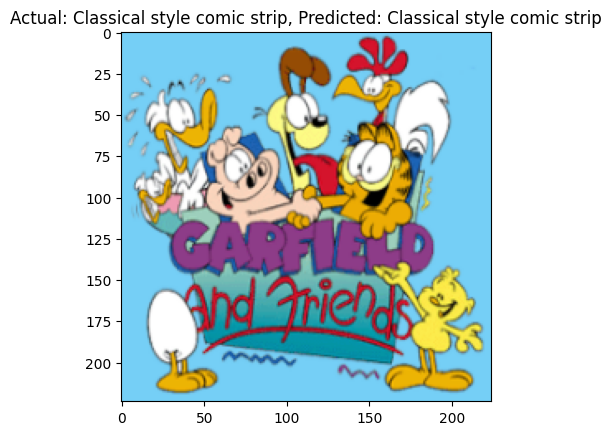

1/1 [==============================] - 0s 175ms/step


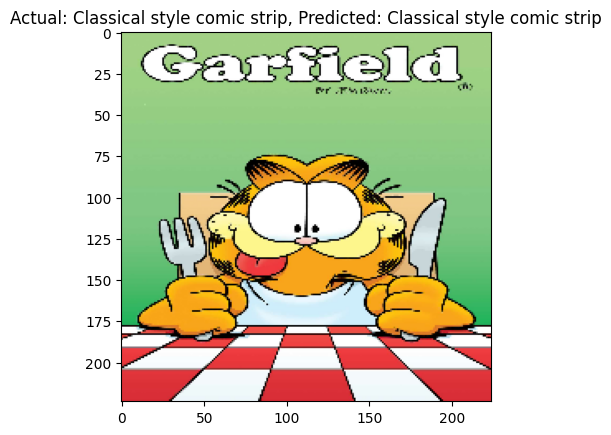

1/1 [==============================] - 0s 172ms/step


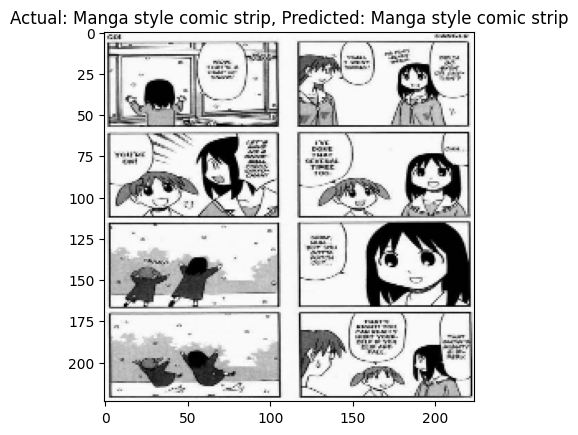

1/1 [==============================] - 0s 183ms/step


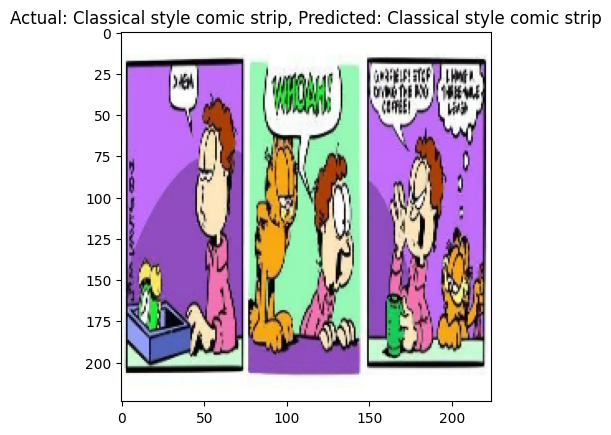

1/1 [==============================] - 0s 188ms/step


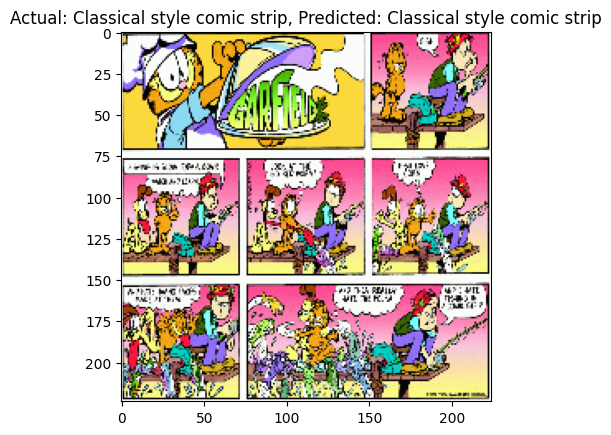

1/1 [==============================] - 0s 189ms/step


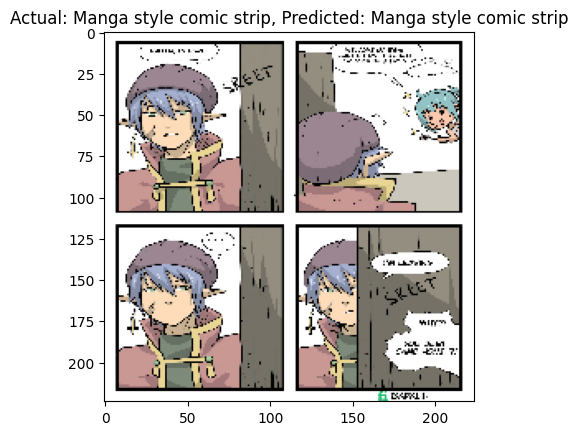

1/1 [==============================] - 0s 211ms/step


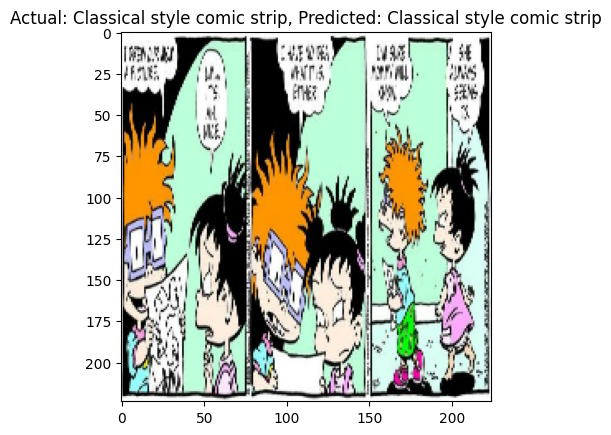

1/1 [==============================] - 0s 187ms/step


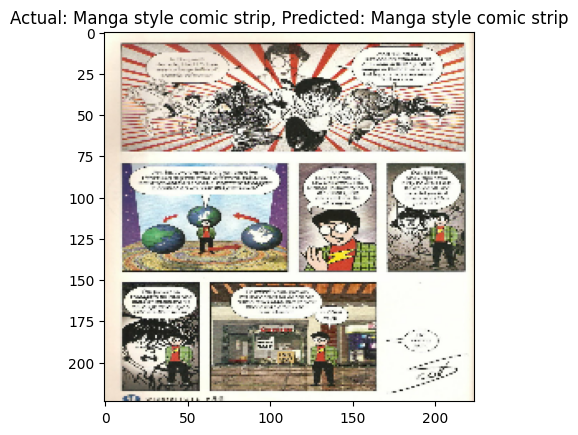

1/1 [==============================] - 0s 185ms/step


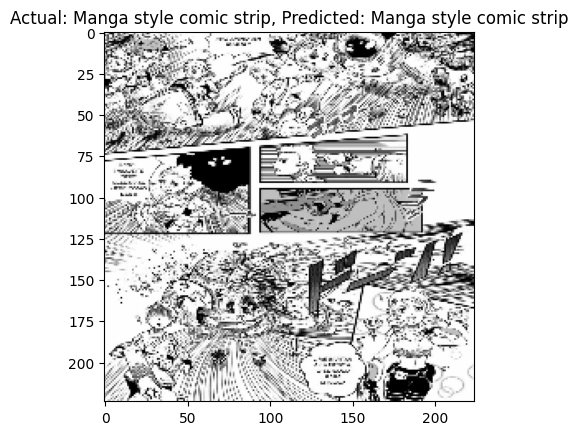

1/1 [==============================] - 0s 191ms/step


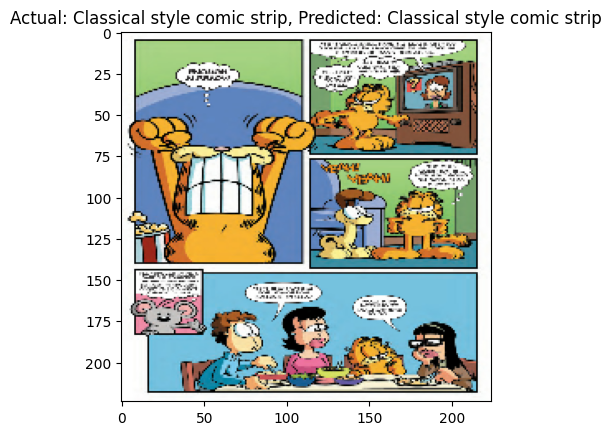

1/1 [==============================] - 0s 203ms/step


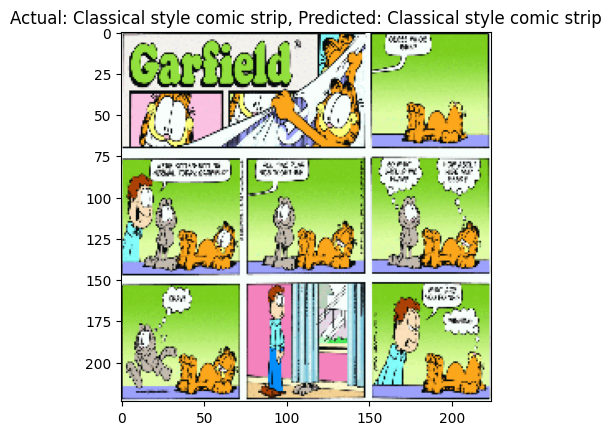

1/1 [==============================] - 0s 221ms/step


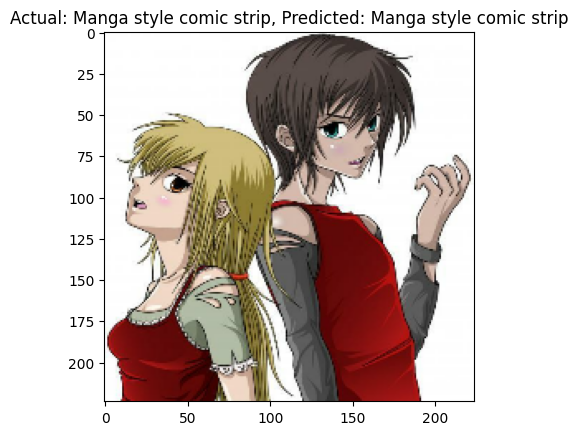

1/1 [==============================] - 0s 218ms/step


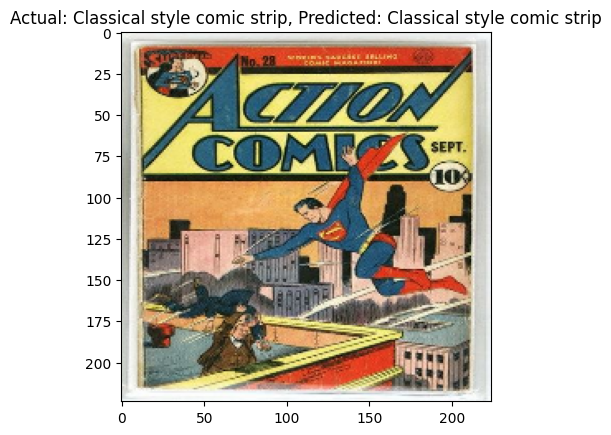

1/1 [==============================] - 0s 167ms/step


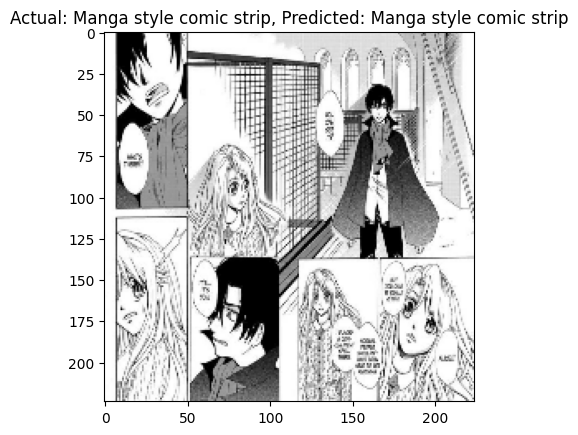

1/1 [==============================] - 0s 186ms/step


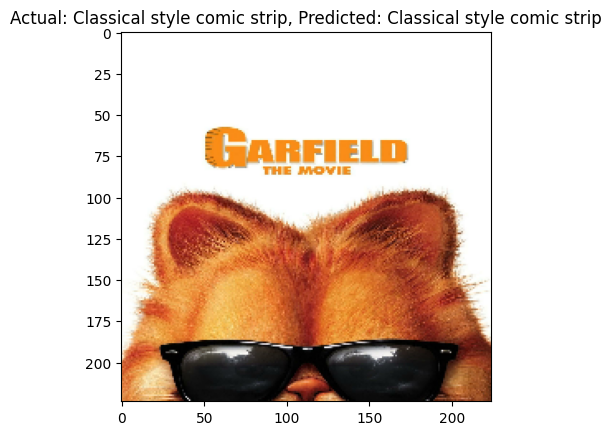

1/1 [==============================] - 0s 201ms/step


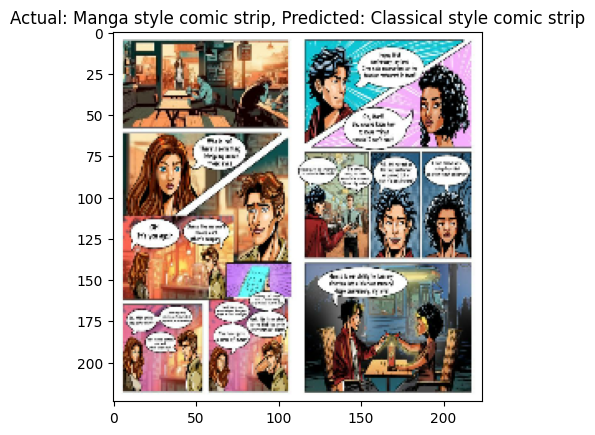

1/1 [==============================] - 0s 191ms/step


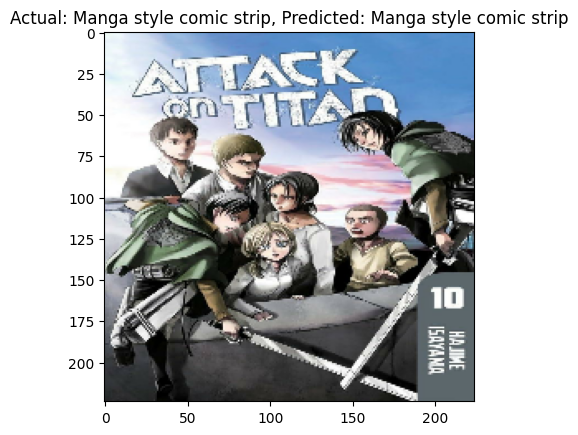

1/1 [==============================] - 0s 175ms/step


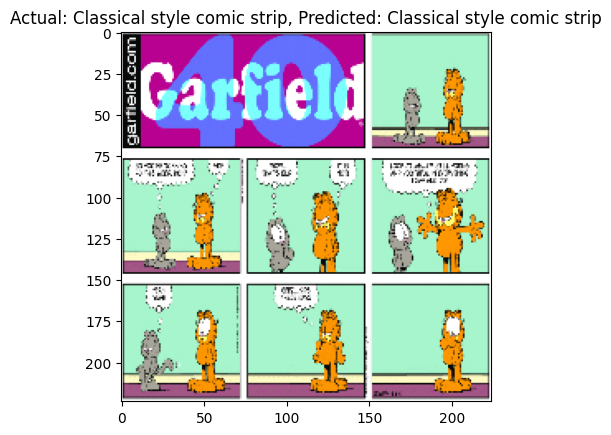

In [20]:
y_test=[]
# Iterate over the testing dataset and make predictions
for images, labels in test_ds:
    # Assuming your model predicts in categorical format
    predictions = cnn.predict(images)
    
    # Convert predictions and actual labels to class labels
    predicted_label = class_labels[np.argmax(predictions)]
    actual_label = class_labels[np.argmax(labels.numpy())]
    y_test.append(actual_label)
    # Display the image with actual and predicted labels
    plt.imshow(images[0].numpy().astype("uint8"))
    plt.title(f"Actual: {actual_label}, Predicted: {predicted_label}")
    plt.show()


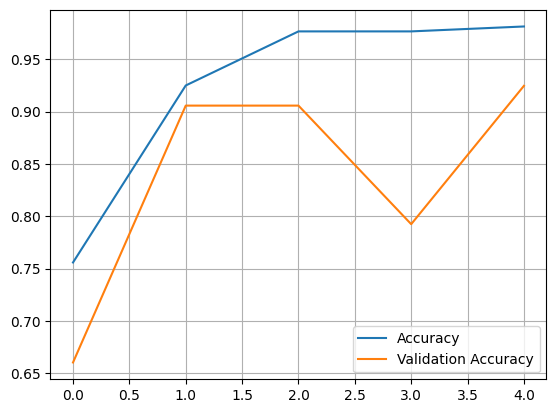

In [36]:
plt.plot(range(5),history.history['accuracy'],label='Accuracy')
plt.plot(range(5),history.history['val_accuracy'],label='Validation Accuracy')
plt.legend()
plt.grid()

In [37]:
cnn.save("model.h5")


c:\Users\yashm\anaconda3\envs\streamlit\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [42]:
from tensorflow.keras.models import load_model
loaded_model = load_model("model.h5")

In [48]:
train_ds.class_names

['Classical style comic strip', 'Manga style comic strip']

In [61]:
import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing import image
from PIL import Image
from tensorflow.keras.models import load_model
loaded_model = load_model("model.h5")
def get_predict(path):
    test_image=image.load_img(path,target_size=(224,224))
    test_image=image.img_to_array(test_image)
    test_image=np.expand_dims(test_image,axis=0)
    l=['Classical style comic strip', 'Manga style comic strip']
    result=loaded_model.predict(test_image)
    result=l[np.argmax(result)]
    pil_im=Image.open(path)
    im_array=np.asarray(pil_im)
    plt.imshow(im_array)
    plt.title(f"Predicted Label: {result}")

1/1 [==============================] - 0s 391ms/step


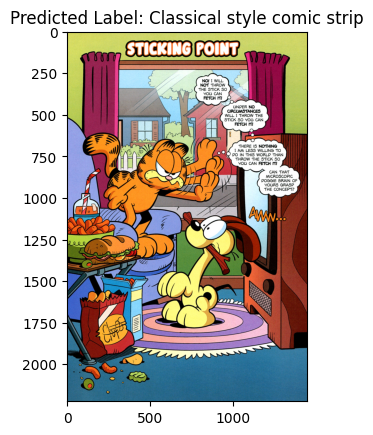

In [ ]:
get_predict('Part4-data/classical style comic strip/Image_27.jpg')